In [ ]:
"""
Official paper plots. Use cmz_plot.ipynb for organized visualization and cmz_scratch.ipynb for scratch work
"""
import sys
import os.path

path = "~/apps/kratos/visual"
full_path = os.path.expanduser(path)

%env KRATOS_VISUAL_DIR=$full_path
sys.path.append( "../visual" )
from proxy import *
%load_ext autoreload
%autoreload 2
%reload_ext autoreload
%autoreload 2
#%aimport binary_io
#%aimport hydro_data
#%aimport slice_plot
#%aimport cmz_init
%aimport proxy
%matplotlib inline
from matplotlib import rc

rc('font', **{'family': 'serif', 'serif': ['Computer Modern']})

plt.rcParams[ "text.usetex" ] = True
paper_plot_dir = "../cmz/paper_plots"

env: KRATOS_VISUAL_DIR=/home/cmz_colab/apps/kratos/visual


soxs : [WARNING  ] 2026-05-29 21:01:41,103 Setting 'soxs_data_dir' to /home/cmz_colab/.cache/soxs for this session. Please update your configuration if you want it somewhere else.


file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00030.bin; time = 300
tcreatemrg not found, skipping


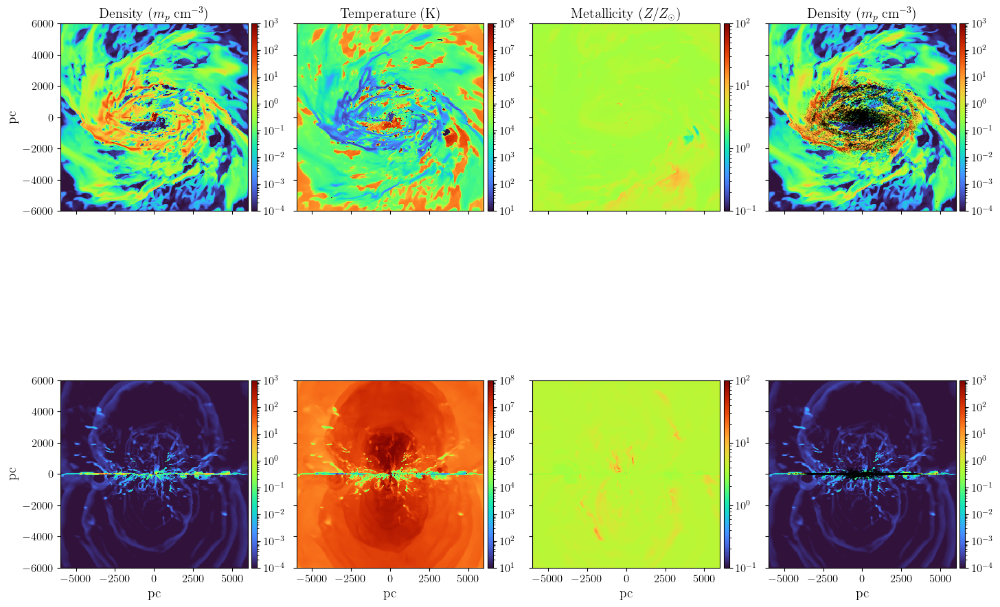

In [2]:
d_base  = get_last_dd( f'../cmz/cmz_test/outputs/cmz_fb3_b3e3_{fstring( 30 )}.bin', -1, enroll_prim=True, data_type = galaxy_data );
fig2 = f_plot_grid( d_base,  figsize=( 17, 13.5 )# , 
                    ,xlims = [ ( -6000, 6000 ), ( -6000, 6000 ) ] 
                    ,ylims = [ ( -6000, 6000 ), ( -6000, 6000 ) ]
                    #,xlims = [ ( -12000, 12000 ), ( -12000, 12000 ) ] 
                    #,ylims = [ ( -12000, 12000 ), ( -12000, 12000 ) ]
                    #log   = [ True, True, True, False ],
                    #locs  = [ [ 1e-2, 1e-2, 1e-2, 2 ], [ 1e-2, 1e-2, 1e-2, 1e-2, 1e-2 ] ],
                    #axes  = 2,
                    #z0s   = [ 1, 1, -1, 1 / ( 4 * np.pi * G_code ) ],
                    #z0s   = [ 1, 1, 1, 1, -1 ],
                    #flds  = [ 'rho', 'T_ent', 'met', 'rho' ],
                    #zlims = [ ( 1e-4, 1e4 ), ( 1e1, 1e8 ), ( 1e-1, 1e2 ), ( 1e-2, 1e3 ) ],
                    #part_plot_i = [] )#( 1e-4, 1 ) ] )
                    )

In [3]:
filter = par_pos_cut( d_base, [ 100, 500 ], [ -140, 140 ], coord='cyl' )
np.sum( d_base.data['particle_sfr'][filter] ) * m0 / modot / ( t0 / yr )

0.14351750166079089

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00012.bin; time = 120
file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00015.bin; time = 150.001
file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00018.bin; time = 180
file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00021.bin; time = 210
file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00023.bin; time = 230
file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00025.bin; time = 250
file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00027.bin; time = 270
file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00029.bin; time = 290


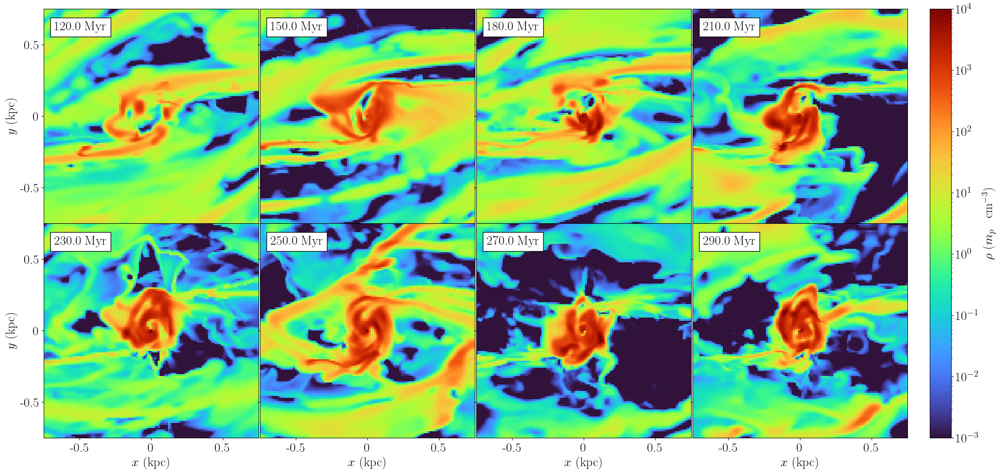

In [4]:
#Faceon slices at different times
import matplotlib.gridspec as gridspec

dirname = "../cmz/cmz_test/outputs"
outname = "cmz_fb3_b3e3"

rows = 2
cols = 4
cbar_rat = 0.1
cbar_space = 0.1
outs = [ 12, 15, 18, 21, 23, 25, 27, 29 ]
xlim = [ -750, 750 ]
ylim = [ -750, 750 ]
x_ticks      = [ -500, 0, 500 ]
x_tick_labels = [ "-0.5", "0", "0.5" ]
y_ticks      = [ -500, 0, 500 ]
y_tick_labels = [ "-0.5", "0", "0.5" ]
plt.rcParams['font.size'] = 20
fontsize = 20
###################################################3
outs = np.array( outs ).reshape( rows, cols )

f = plt.figure(figsize=(6*( cols + cbar_rat + cbar_space ),6*rows))
width_ratios = [ 1 for i in range( cols ) ]
width_ratios.append( cbar_space )
width_ratios.append( cbar_rat )
gs = gridspec.GridSpec(rows, cols + 2, figure=f, width_ratios=width_ratios, hspace=0, wspace=0)
f.canvas.draw()
for row, o in enumerate( outs ):
    for col, out in enumerate( o ):
        d  = get_last_dd( f'{dirname}/{outname}_{fstring( out )}.bin', -1, enroll_prim=True, data_type = galaxy_data )
        
        labelbottom = False
        if row == rows - 1:
            labelbottom = True
        labelleft = False
        if col == 0:
            labelleft = True

        if labelleft:
            ylabel = r"$y$ (kpc)"
        else:
            ylabel=None

        if labelbottom:
            xlabel = r"$x$ (kpc)"
        else:
            xlabel=None

        ax, _ = f_plot( d, "rho", f, zlim=[ 1e-3,1e4 ], rect=gs[ row, col ], 
                        no_cbar=True, fontsize=fontsize, loc=0.01 )
        ax.set_xlim( xlim )
        ax.set_ylim( ylim )
        ax.set_xlabel( xlabel, fontsize=fontsize )
        ax.set_ylabel( ylabel, fontsize=fontsize )
        last_pcm = ax.collections[ -1 ]
        ax.tick_params( labelbottom=labelbottom, labelleft=labelleft )
        ax.set_xticks( x_ticks, labels=x_tick_labels, fontsize=fontsize )
        ax.set_yticks( y_ticks, labels=y_tick_labels, fontsize=fontsize )
        ax.text( xlim[ 0 ] * 0.9, ylim[ 1 ] * 0.8, f"{round( d.globals['time'], 2 )} Myr", color='black', fontsize=fontsize, 
                 bbox=dict(boxstyle="square", facecolor="white", edgecolor="black") )
cbar_ax = f.add_subplot(gs[:, -1])
cbar    = f.colorbar(last_pcm, cax=cbar_ax)
cbar.set_label(r"$\rho$ ($m_p$ \; cm$^{-3}$)", fontsize=fontsize)
cbar.ax.tick_params(labelsize=20)
plt.savefig( f"{paper_plot_dir}/fiducial_faceon_rho.png", dpi=300, bbox_inches='tight' )

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00012.bin; time = 120


yt : [WARNING  ] 2026-05-29 21:03:53,669 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-29 21:03:53,670 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-29 21:03:53,671 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-29 21:03:53,672 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-29 21:03:53,672 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-29 21:03:53,740 Parameters: current_time              = 120.00005188041503
yt : [INFO     ] 2026-05-29 21:03:53,740 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-29 21:03:53,741 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-29 21:03:53,741 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-29 21:03:53,742 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-29 21:04:00,295 Pro

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00018.bin; time = 180


yt : [WARNING  ] 2026-05-29 21:04:50,107 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-29 21:04:50,108 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-29 21:04:50,109 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-29 21:04:50,109 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-29 21:04:50,110 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-29 21:04:50,154 Parameters: current_time              = 180.00001721176605
yt : [INFO     ] 2026-05-29 21:04:50,155 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-29 21:04:50,155 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-29 21:04:50,156 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-29 21:04:50,156 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-29 21:04:56,429 Pro

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00024.bin; time = 240


yt : [WARNING  ] 2026-05-29 21:05:50,906 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-29 21:05:50,907 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-29 21:05:50,907 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-29 21:05:50,908 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-29 21:05:50,908 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-29 21:05:50,952 Parameters: current_time              = 240.0000410111253
yt : [INFO     ] 2026-05-29 21:05:50,953 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-29 21:05:50,953 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-29 21:05:50,954 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-29 21:05:50,954 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-29 21:05:56,542 Proj

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00030.bin; time = 300


yt : [WARNING  ] 2026-05-29 21:06:10,115 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-29 21:06:10,116 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-29 21:06:10,116 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-29 21:06:10,117 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-29 21:06:10,117 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-29 21:06:10,154 Parameters: current_time              = 300.0
yt : [INFO     ] 2026-05-29 21:06:10,155 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-29 21:06:10,155 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-29 21:06:10,156 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-29 21:06:10,156 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-29 21:06:16,936 Projection compl

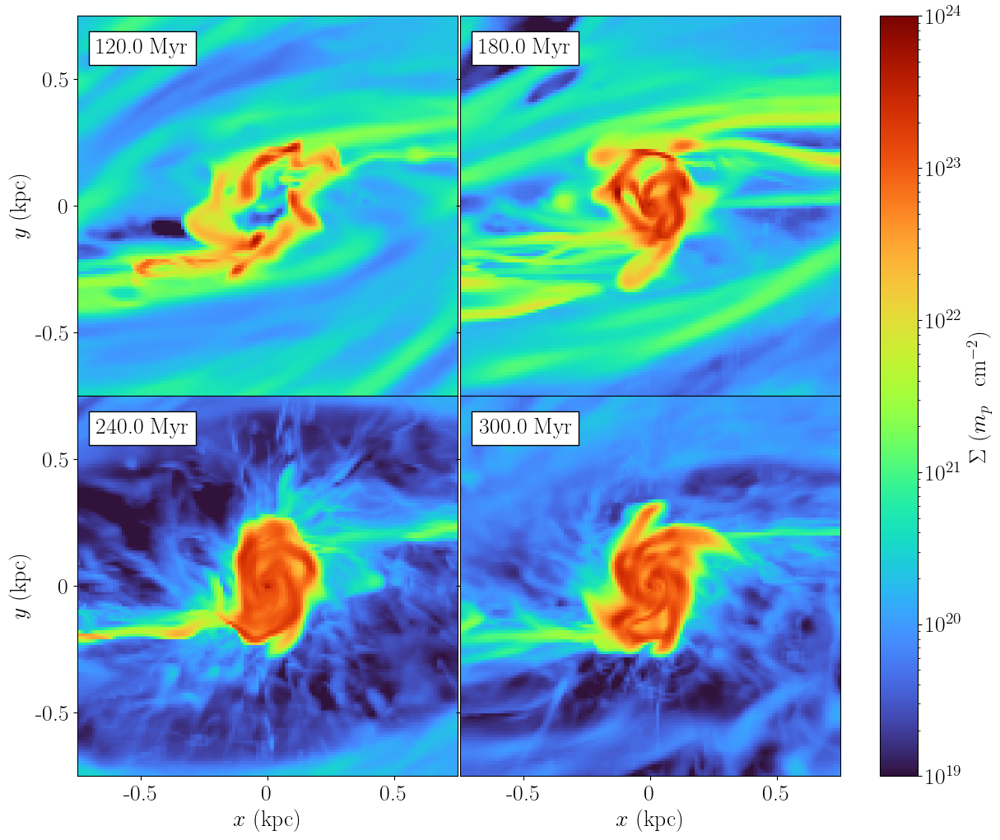

In [2]:
#Faceon slices at different times
import matplotlib.gridspec as gridspec

dirname = "../cmz/cmz_test/outputs"
outname = "cmz_fb3_b3e3"

rows = 2
cols = 2
cbar_rat = 0.1
cbar_space = 0.1
outs = [ 12, 18, 24, 30 ]
xlim = [ -750, 750 ]
ylim = [ -750, 750 ]
x_ticks      = [ -500, 0, 500 ]
x_tick_labels = [ "-0.5", "0", "0.5" ]
y_ticks      = [ -500, 0, 500 ]
y_tick_labels = [ "-0.5", "0", "0.5" ]
plt.rcParams['font.size'] = 20
fontsize = 20
###################################################3
outs = np.array( outs ).reshape( rows, cols )

f = plt.figure(figsize=(6*( cols + cbar_rat + cbar_space ),6*rows))
width_ratios = [ 1 for i in range( cols ) ]
width_ratios.append( cbar_space )
width_ratios.append( cbar_rat )
gs = gridspec.GridSpec(rows, cols + 2, figure=f, width_ratios=width_ratios, hspace=0, wspace=0)
f.canvas.draw()
for row, o in enumerate( outs ):
    for col, out in enumerate( o ):
        d  = get_last_dd( f'{dirname}/{outname}_{fstring( out )}.bin', -1, enroll_prim=True, data_type = galaxy_data )
        dyt = load_kratos_yt( d )
        prj = yt.ProjectionPlot(dyt, "z", ("gas", "density"), width=(( xlim[ 1 ] - xlim[ 0 ] )/1e3,"kpc") )
        frb = prj.data_source.to_frb((( xlim[ 1 ] - xlim[ 0 ] )/1e3, "kpc"), 800)
        img = np.array(frb[("gas", "density")].to("mp/cm**2"))
        
        labelbottom = False
        if row == rows - 1:
            labelbottom = True
        labelleft = False
        if col == 0:
            labelleft = True

        if labelleft:
            ylabel = r"$y$ (kpc)"
        else:
            ylabel=None

        if labelbottom:
            xlabel = r"$x$ (kpc)"
        else:
            xlabel=None
    
        ext = [ xlim[ 0 ], xlim[ 1 ], ylim[ 0 ], ylim[ 1 ] ]
        ax = f.add_subplot( gs[ row, col ] )
        im = ax.imshow(
                        img,
                        origin="lower",
                        extent=ext,
                        norm=LogNorm(vmin=1e19, vmax=1e24),
                        cmap="turbo",
                        interpolation="nearest"
                        )
        
        ax.set_xlim( xlim )
        ax.set_ylim( ylim )
        ax.set_xlabel( xlabel, fontsize=fontsize )
        ax.set_ylabel( ylabel, fontsize=fontsize )
        #last_pcm = ax.collections[ -1 ]
        ax.tick_params( labelbottom=labelbottom, labelleft=labelleft )
        ax.set_xticks( x_ticks, labels=x_tick_labels, fontsize=fontsize )
        ax.set_yticks( y_ticks, labels=y_tick_labels, fontsize=fontsize )
        ax.text( xlim[ 0 ] * 0.9, ylim[ 1 ] * 0.8, f"{round( d.globals['time'], 2 )} Myr", color='black', fontsize=fontsize, 
                 bbox=dict(boxstyle="square", facecolor="white", edgecolor="black") )
cbar_ax = f.add_subplot(gs[:, -1])
cbar = f.colorbar( im, cax=cbar_ax )
cbar.set_label(r"$\Sigma$ ($m_p$ \; cm$^{-2}$)", fontsize=fontsize)
cbar.ax.tick_params(labelsize=20)
plt.savefig( f"{paper_plot_dir}/fiducial_faceon_sigma_poster.png", dpi=300, bbox_inches='tight' )

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00012.bin; time = 120


yt : [WARNING  ] 2026-05-29 21:12:34,635 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-29 21:12:34,636 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-29 21:12:34,637 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-29 21:12:34,638 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-29 21:12:34,639 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-29 21:12:34,679 Parameters: current_time              = 120.00005188041503
yt : [INFO     ] 2026-05-29 21:12:34,679 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-29 21:12:34,680 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-29 21:12:34,681 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-29 21:12:34,682 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-29 21:12:49,184 Pro

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00018.bin; time = 180


yt : [WARNING  ] 2026-05-29 21:12:58,520 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-29 21:12:58,521 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-29 21:12:58,522 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-29 21:12:58,523 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-29 21:12:58,524 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-29 21:12:58,562 Parameters: current_time              = 180.00001721176605
yt : [INFO     ] 2026-05-29 21:12:58,563 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-29 21:12:58,563 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-29 21:12:58,564 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-29 21:12:58,565 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-29 21:13:13,756 Pro

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00024.bin; time = 240


yt : [WARNING  ] 2026-05-29 21:13:21,285 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-29 21:13:21,286 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-29 21:13:21,287 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-29 21:13:21,288 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-29 21:13:21,289 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-29 21:13:21,329 Parameters: current_time              = 240.0000410111253
yt : [INFO     ] 2026-05-29 21:13:21,329 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-29 21:13:21,330 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-29 21:13:21,331 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-29 21:13:21,332 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-29 21:13:35,150 Proj

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00030.bin; time = 300


yt : [WARNING  ] 2026-05-29 21:13:45,171 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-29 21:13:45,172 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-29 21:13:45,173 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-29 21:13:45,174 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-29 21:13:45,175 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-29 21:13:45,215 Parameters: current_time              = 300.0
yt : [INFO     ] 2026-05-29 21:13:45,216 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-29 21:13:45,217 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-29 21:13:45,218 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-29 21:13:45,218 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-29 21:14:02,642 Projection compl

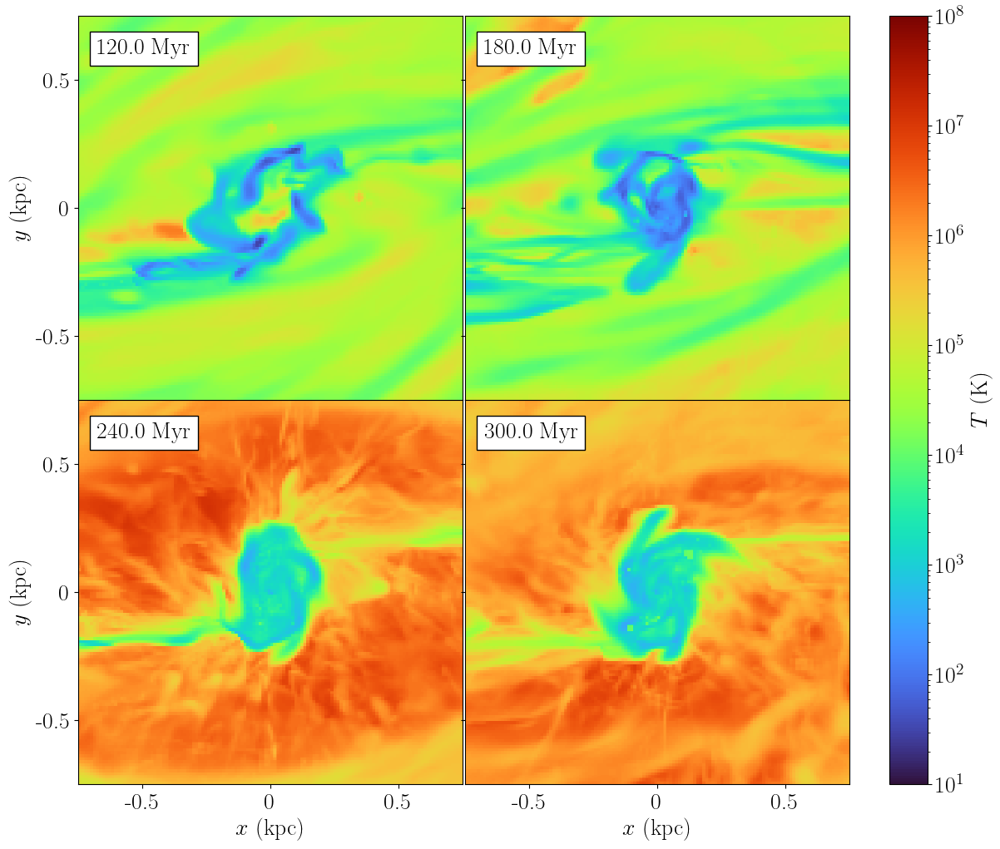

In [4]:
#Faceon slices at different times
import matplotlib.gridspec as gridspec

dirname = "../cmz/cmz_test/outputs"
outname = "cmz_fb3_b3e3"

rows = 2
cols = 2
cbar_rat = 0.1
cbar_space = 0.1
outs = [ 12, 18, 24, 30 ]
xlim = [ -750, 750 ]
ylim = [ -750, 750 ]
x_ticks      = [ -500, 0, 500 ]
x_tick_labels = [ "-0.5", "0", "0.5" ]
y_ticks      = [ -500, 0, 500 ]
y_tick_labels = [ "-0.5", "0", "0.5" ]
plt.rcParams['font.size'] = 20
fontsize = 20
###################################################3
outs = np.array( outs ).reshape( rows, cols )

f = plt.figure(figsize=(6*( cols + cbar_rat + cbar_space ),6*rows))
width_ratios = [ 1 for i in range( cols ) ]
width_ratios.append( cbar_space )
width_ratios.append( cbar_rat )
gs = gridspec.GridSpec(rows, cols + 2, figure=f, width_ratios=width_ratios, hspace=0, wspace=0)
f.canvas.draw()
for row, o in enumerate( outs ):
    for col, out in enumerate( o ):
        d  = get_last_dd( f'{dirname}/{outname}_{fstring( out )}.bin', -1, enroll_prim=True, data_type = galaxy_data )
        dyt = load_kratos_yt( d )
        prj = yt.ProjectionPlot(dyt, "z", 
                                ("gas", "temperature"), 
                                width=(( xlim[ 1 ] - xlim[ 0 ] )/1e3,"kpc"),
                                 weight_field=("gas","density") )
        frb = prj.data_source.to_frb((( xlim[ 1 ] - xlim[ 0 ] )/1e3, "kpc"), 800)
        img = np.array(frb[("gas", "temperature")].to("K"))
        
        labelbottom = False
        if row == rows - 1:
            labelbottom = True
        labelleft = False
        if col == 0:
            labelleft = True

        if labelleft:
            ylabel = r"$y$ (kpc)"
        else:
            ylabel=None

        if labelbottom:
            xlabel = r"$x$ (kpc)"
        else:
            xlabel=None
    
        ext = [ xlim[ 0 ], xlim[ 1 ], ylim[ 0 ], ylim[ 1 ] ]
        ax = f.add_subplot( gs[ row, col ] )
        im = ax.imshow(
                        img,
                        origin="lower",
                        extent=ext,
                        norm=LogNorm(vmin=1e1, vmax=1e8),
                        cmap="turbo",
                        interpolation="nearest"
                        )
        
        ax.set_xlim( xlim )
        ax.set_ylim( ylim )
        ax.set_xlabel( xlabel, fontsize=fontsize )
        ax.set_ylabel( ylabel, fontsize=fontsize )
        #last_pcm = ax.collections[ -1 ]
        ax.tick_params( labelbottom=labelbottom, labelleft=labelleft )
        ax.set_xticks( x_ticks, labels=x_tick_labels, fontsize=fontsize )
        ax.set_yticks( y_ticks, labels=y_tick_labels, fontsize=fontsize )
        ax.text( xlim[ 0 ] * 0.9, ylim[ 1 ] * 0.8, f"{round( d.globals['time'], 2 )} Myr", color='black', fontsize=fontsize, 
                 bbox=dict(boxstyle="square", facecolor="white", edgecolor="black") )
cbar_ax = f.add_subplot(gs[:, -1])
cbar = f.colorbar( im, cax=cbar_ax )
cbar.set_label(r"$T$ (K)", fontsize=fontsize)
cbar.ax.tick_params(labelsize=20)
plt.savefig( f"{paper_plot_dir}/fiducial_faceon_temperature_poster.png", dpi=300, bbox_inches='tight' )

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00012.bin; time = 120


yt : [WARNING  ] 2026-05-28 20:28:34,567 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-28 20:28:34,568 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-28 20:28:34,568 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-28 20:28:34,569 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-28 20:28:34,570 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-28 20:28:34,607 Parameters: current_time              = 120.00005188041503
yt : [INFO     ] 2026-05-28 20:28:34,608 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-28 20:28:34,608 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-28 20:28:34,609 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-28 20:28:34,609 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-28 20:28:39,941 Pro

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00015.bin; time = 150.001


yt : [WARNING  ] 2026-05-28 20:28:51,852 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-28 20:28:51,852 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-28 20:28:51,853 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-28 20:28:51,853 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-28 20:28:51,854 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-28 20:28:51,892 Parameters: current_time              = 150.00053846663513
yt : [INFO     ] 2026-05-28 20:28:51,892 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-28 20:28:51,893 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-28 20:28:51,893 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-28 20:28:51,894 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-28 20:28:56,733 Pro

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00018.bin; time = 180


yt : [WARNING  ] 2026-05-28 20:29:03,507 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-28 20:29:03,507 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-28 20:29:03,508 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-28 20:29:03,509 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-28 20:29:03,509 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-28 20:29:03,546 Parameters: current_time              = 180.00001721176605
yt : [INFO     ] 2026-05-28 20:29:03,546 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-28 20:29:03,547 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-28 20:29:03,547 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-28 20:29:03,548 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-28 20:29:08,328 Pro

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00021.bin; time = 210


yt : [WARNING  ] 2026-05-28 20:29:17,538 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-28 20:29:17,539 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-28 20:29:17,540 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-28 20:29:17,540 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-28 20:29:17,541 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-28 20:29:17,579 Parameters: current_time              = 210.0000852703657
yt : [INFO     ] 2026-05-28 20:29:17,580 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-28 20:29:17,580 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-28 20:29:17,581 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-28 20:29:17,581 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-28 20:29:23,438 Proj

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00023.bin; time = 230


yt : [WARNING  ] 2026-05-28 20:29:36,732 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-28 20:29:36,733 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-28 20:29:36,733 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-28 20:29:36,734 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-28 20:29:36,734 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-28 20:29:36,772 Parameters: current_time              = 230.00000992019292
yt : [INFO     ] 2026-05-28 20:29:36,773 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-28 20:29:36,773 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-28 20:29:36,774 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-28 20:29:36,774 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-28 20:29:45,416 Pro

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00025.bin; time = 250


yt : [WARNING  ] 2026-05-28 20:29:54,681 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-28 20:29:54,681 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-28 20:29:54,682 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-28 20:29:54,682 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-28 20:29:54,683 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-28 20:29:54,720 Parameters: current_time              = 250.00005582033853
yt : [INFO     ] 2026-05-28 20:29:54,721 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-28 20:29:54,721 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-28 20:29:54,722 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-28 20:29:54,722 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-28 20:29:59,533 Pro

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00027.bin; time = 270


yt : [WARNING  ] 2026-05-28 20:30:06,630 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-28 20:30:06,630 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-28 20:30:06,631 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-28 20:30:06,631 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-28 20:30:06,632 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-28 20:30:06,670 Parameters: current_time              = 270.0000321498999
yt : [INFO     ] 2026-05-28 20:30:06,671 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-28 20:30:06,671 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-28 20:30:06,672 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-28 20:30:06,672 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-28 20:30:11,418 Proj

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00029.bin; time = 290


yt : [WARNING  ] 2026-05-28 20:30:19,506 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-28 20:30:19,506 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-28 20:30:19,507 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-28 20:30:19,507 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-28 20:30:19,508 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-28 20:30:19,545 Parameters: current_time              = 290.0000154891313
yt : [INFO     ] 2026-05-28 20:30:19,546 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-28 20:30:19,546 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-28 20:30:19,547 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-28 20:30:19,547 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-28 20:30:24,427 Proj

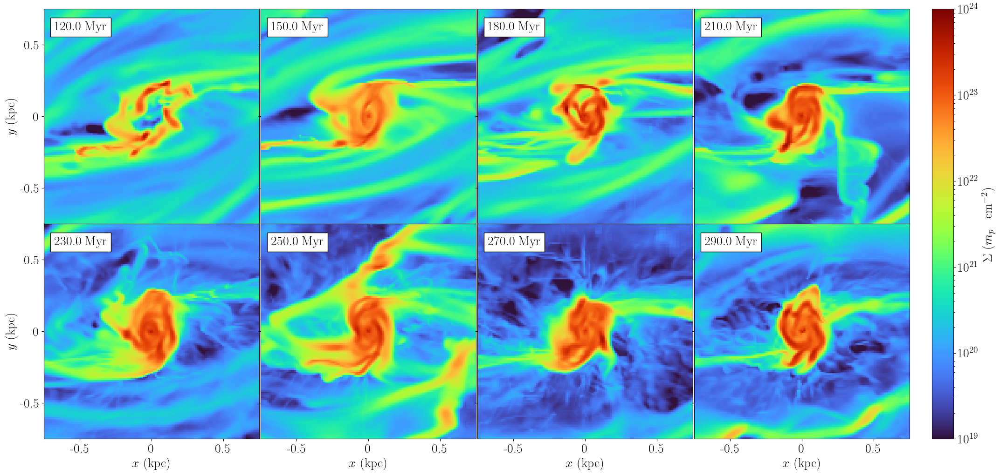

In [ ]:
#Faceon slices at different times
import matplotlib.gridspec as gridspec

dirname = "../cmz/cmz_test/outputs"
outname = "cmz_fb3_b3e3"

rows = 2
cols = 4
cbar_rat = 0.1
cbar_space = 0.1
outs = [ 12, 15, 18, 21, 23, 25, 27, 29 ]
xlim = [ -750, 750 ]
ylim = [ -750, 750 ]
x_ticks      = [ -500, 0, 500 ]
x_tick_labels = [ "-0.5", "0", "0.5" ]
y_ticks      = [ -500, 0, 500 ]
y_tick_labels = [ "-0.5", "0", "0.5" ]
plt.rcParams['font.size'] = 20
fontsize = 20
###################################################3
outs = np.array( outs ).reshape( rows, cols )

f = plt.figure(figsize=(6*( cols + cbar_rat + cbar_space ),6*rows))
width_ratios = [ 1 for i in range( cols ) ]
width_ratios.append( cbar_space )
width_ratios.append( cbar_rat )
gs = gridspec.GridSpec(rows, cols + 2, figure=f, width_ratios=width_ratios, hspace=0, wspace=0)
f.canvas.draw()
for row, o in enumerate( outs ):
    for col, out in enumerate( o ):
        d  = get_last_dd( f'{dirname}/{outname}_{fstring( out )}.bin', -1, enroll_prim=True, data_type = galaxy_data )
        dyt = load_kratos_yt( d )
        prj = yt.ProjectionPlot(dyt, "z", ("gas", "density"), width=(( xlim[ 1 ] - xlim[ 0 ] )/1e3,"kpc") )
        frb = prj.data_source.to_frb((( xlim[ 1 ] - xlim[ 0 ] )/1e3, "kpc"), 800)
        img = np.array(frb[("gas", "density")].to("mp/cm**2"))
        
        labelbottom = False
        if row == rows - 1:
            labelbottom = True
        labelleft = False
        if col == 0:
            labelleft = True

        if labelleft:
            ylabel = r"$y$ (kpc)"
        else:
            ylabel=None

        if labelbottom:
            xlabel = r"$x$ (kpc)"
        else:
            xlabel=None
    
        ext = [ xlim[ 0 ], xlim[ 1 ], ylim[ 0 ], ylim[ 1 ] ]
        ax = f.add_subplot( gs[ row, col ] )
        im = ax.imshow(
                        img,
                        origin="lower",
                        extent=ext,
                        norm=LogNorm(vmin=1e19, vmax=1e24),
                        cmap="turbo",
                        interpolation="nearest"
                        )
        
        ax.set_xlim( xlim )
        ax.set_ylim( ylim )
        ax.set_xlabel( xlabel, fontsize=fontsize )
        ax.set_ylabel( ylabel, fontsize=fontsize )
        #last_pcm = ax.collections[ -1 ]
        ax.tick_params( labelbottom=labelbottom, labelleft=labelleft )
        ax.set_xticks( x_ticks, labels=x_tick_labels, fontsize=fontsize )
        ax.set_yticks( y_ticks, labels=y_tick_labels, fontsize=fontsize )
        ax.text( xlim[ 0 ] * 0.9, ylim[ 1 ] * 0.8, f"{round( d.globals['time'], 2 )} Myr", color='black', fontsize=fontsize, 
                 bbox=dict(boxstyle="square", facecolor="white", edgecolor="black") )
cbar_ax = f.add_subplot(gs[:, -1])
cbar = f.colorbar( im, cax=cbar_ax )
cbar.set_label(r"$\Sigma$ ($m_p$ \; cm$^{-2}$)", fontsize=fontsize)
cbar.ax.tick_params(labelsize=20)
plt.savefig( f"{paper_plot_dir}/fiducial_faceon_sigma.png", dpi=300, bbox_inches='tight' )

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00012.bin; time = 120


yt : [WARNING  ] 2026-05-28 21:18:18,015 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-28 21:18:18,016 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-28 21:18:18,016 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-28 21:18:18,017 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-28 21:18:18,017 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-28 21:18:18,056 Parameters: current_time              = 120.00005188041503
yt : [INFO     ] 2026-05-28 21:18:18,056 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-28 21:18:18,057 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-28 21:18:18,057 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-28 21:18:18,058 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-28 21:18:22,852 Pro

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00015.bin; time = 150.001


yt : [WARNING  ] 2026-05-28 21:18:49,039 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-28 21:18:49,039 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-28 21:18:49,040 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-28 21:18:49,041 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-28 21:18:49,041 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-28 21:18:49,079 Parameters: current_time              = 150.00053846663513
yt : [INFO     ] 2026-05-28 21:18:49,079 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-28 21:18:49,080 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-28 21:18:49,081 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-28 21:18:49,081 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-28 21:18:53,861 Pro

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00018.bin; time = 180


yt : [WARNING  ] 2026-05-28 21:19:18,764 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-28 21:19:18,765 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-28 21:19:18,766 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-28 21:19:18,767 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-28 21:19:18,767 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-28 21:19:18,806 Parameters: current_time              = 180.00001721176605
yt : [INFO     ] 2026-05-28 21:19:18,806 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-28 21:19:18,807 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-28 21:19:18,807 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-28 21:19:18,808 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-28 21:19:23,677 Pro

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00021.bin; time = 210


yt : [WARNING  ] 2026-05-28 21:19:50,807 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-28 21:19:50,808 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-28 21:19:50,808 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-28 21:19:50,809 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-28 21:19:50,809 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-28 21:19:50,848 Parameters: current_time              = 210.0000852703657
yt : [INFO     ] 2026-05-28 21:19:50,848 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-28 21:19:50,849 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-28 21:19:50,849 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-28 21:19:50,850 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-28 21:19:55,987 Proj

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00023.bin; time = 230


yt : [WARNING  ] 2026-05-28 21:20:18,678 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-28 21:20:18,679 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-28 21:20:18,680 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-28 21:20:18,680 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-28 21:20:18,681 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-28 21:20:18,718 Parameters: current_time              = 230.00000992019292
yt : [INFO     ] 2026-05-28 21:20:18,718 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-28 21:20:18,719 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-28 21:20:18,719 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-28 21:20:18,720 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-28 21:20:23,560 Pro

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00025.bin; time = 250


yt : [WARNING  ] 2026-05-28 21:20:47,132 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-28 21:20:47,133 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-28 21:20:47,133 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-28 21:20:47,134 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-28 21:20:47,134 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-28 21:20:47,172 Parameters: current_time              = 250.00005582033853
yt : [INFO     ] 2026-05-28 21:20:47,172 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-28 21:20:47,173 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-28 21:20:47,173 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-28 21:20:47,174 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-28 21:20:54,180 Pro

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00027.bin; time = 270


yt : [WARNING  ] 2026-05-28 21:21:17,891 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-28 21:21:17,892 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-28 21:21:17,892 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-28 21:21:17,893 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-28 21:21:17,893 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-28 21:21:17,931 Parameters: current_time              = 270.0000321498999
yt : [INFO     ] 2026-05-28 21:21:17,932 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-28 21:21:17,932 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-28 21:21:17,933 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-28 21:21:17,933 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-28 21:21:22,886 Proj

file: ../cmz/cmz_test/outputs/cmz_fb3_b3e3_00029.bin; time = 290


yt : [WARNING  ] 2026-05-28 21:21:47,269 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-28 21:21:47,269 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-28 21:21:47,270 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-28 21:21:47,270 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-28 21:21:47,271 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-28 21:21:47,309 Parameters: current_time              = 290.0000154891313
yt : [INFO     ] 2026-05-28 21:21:47,309 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-28 21:21:47,309 Parameters: domain_left_edge          = [-6000. -6000. -6000.]
yt : [INFO     ] 2026-05-28 21:21:47,310 Parameters: domain_right_edge         = [6000. 6000. 6000.]
yt : [INFO     ] 2026-05-28 21:21:47,310 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2026-05-28 21:21:52,576 Proj

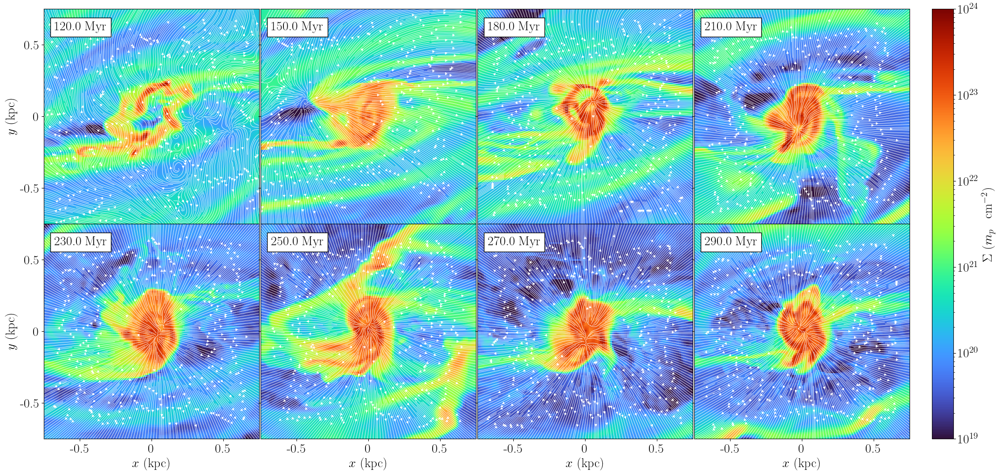

In [9]:
#Faceon slices at different times
import matplotlib.gridspec as gridspec

dirname = "../cmz/cmz_test/outputs"
outname = "cmz_fb3_b3e3"

rows = 2
cols = 4
cbar_rat = 0.1
cbar_space = 0.1
outs = [ 12, 15, 18, 21, 23, 25, 27, 29 ]
xlim = [ -750, 750 ]
ylim = [ -750, 750 ]
x_ticks      = [ -500, 0, 500 ]
x_tick_labels = [ "-0.5", "0", "0.5" ]
y_ticks      = [ -500, 0, 500 ]
y_tick_labels = [ "-0.5", "0", "0.5" ]
plt.rcParams['font.size'] = 20
fontsize = 20

res = 800  # FRB resolution
###################################################3
outs = np.array( outs ).reshape( rows, cols )

f = plt.figure(figsize=(6*( cols + cbar_rat + cbar_space ),6*rows))
width_ratios = [ 1 for i in range( cols ) ]
width_ratios.append( cbar_space )
width_ratios.append( cbar_rat )
gs = gridspec.GridSpec(rows, cols + 2, figure=f, width_ratios=width_ratios, hspace=0, wspace=0)
f.canvas.draw()
for row, o in enumerate( outs ):
    for col, out in enumerate( o ):
        d  = get_last_dd( f'{dirname}/{outname}_{fstring( out )}.bin', -1, enroll_prim=True, data_type = galaxy_data )
        dyt = load_kratos_yt( d )
        prj = yt.ProjectionPlot(dyt, "z", ("gas", "density"), width=(( xlim[ 1 ] - xlim[ 0 ] )/1e3,"kpc") )
        #prj.annotate_streamlines(("gas", "velocity_x"), ("gas", "velocity_y"), density=10)
        frb = prj.data_source.to_frb((( xlim[ 1 ] - xlim[ 0 ] )/1e3, "kpc"), res)
        img = np.array(frb[("gas", "density")].to("mp/cm**2"))

        # Pull velocity fields from the same FRB
        vx = np.array(frb[("gas", "velocity_x")])
        vy = np.array(frb[("gas", "velocity_y")])

        labelbottom = False
        if row == rows - 1:
            labelbottom = True
        labelleft = False
        if col == 0:
            labelleft = True

        if labelleft:
            ylabel = r"$y$ (kpc)"
        else:
            ylabel=None

        if labelbottom:
            xlabel = r"$x$ (kpc)"
        else:
            xlabel=None
    
        ext = [ xlim[ 0 ], xlim[ 1 ], ylim[ 0 ], ylim[ 1 ] ]
        ax = f.add_subplot( gs[ row, col ] )
        im = ax.imshow(
                        img,
                        origin="lower",
                        extent=ext,
                        norm=LogNorm(vmin=1e19, vmax=1e24),
                        cmap="turbo",
                        interpolation="nearest"
                        )
        # Coordinate arrays matching the image extent
        x1d = np.linspace(xlim[0], xlim[1], res)
        y1d = np.linspace(ylim[0], ylim[1], res)

        ax.streamplot(
            x1d, y1d, vx, vy,
            density=5,
            color='white',
            linewidth=0.6,
            arrowsize=0.8
        )
        ax.set_xlim( xlim )
        ax.set_ylim( ylim )
        ax.set_xlabel( xlabel, fontsize=fontsize )
        ax.set_ylabel( ylabel, fontsize=fontsize )
        #last_pcm = ax.collections[ -1 ]
        ax.tick_params( labelbottom=labelbottom, labelleft=labelleft )
        ax.set_xticks( x_ticks, labels=x_tick_labels, fontsize=fontsize )
        ax.set_yticks( y_ticks, labels=y_tick_labels, fontsize=fontsize )
        ax.text( xlim[ 0 ] * 0.9, ylim[ 1 ] * 0.8, f"{round( d.globals['time'], 2 )} Myr", color='black', fontsize=fontsize, 
                 bbox=dict(boxstyle="square", facecolor="white", edgecolor="black") )
cbar_ax = f.add_subplot(gs[:, -1])
cbar = f.colorbar( im, cax=cbar_ax )
cbar.set_label(r"$\Sigma$ ($m_p$ \; cm$^{-2}$)", fontsize=fontsize)
cbar.ax.tick_params(labelsize=20)
plt.savefig( f"{paper_plot_dir}/fiducial_faceon_sigma_streamlines.png", dpi=300, bbox_inches='tight' )

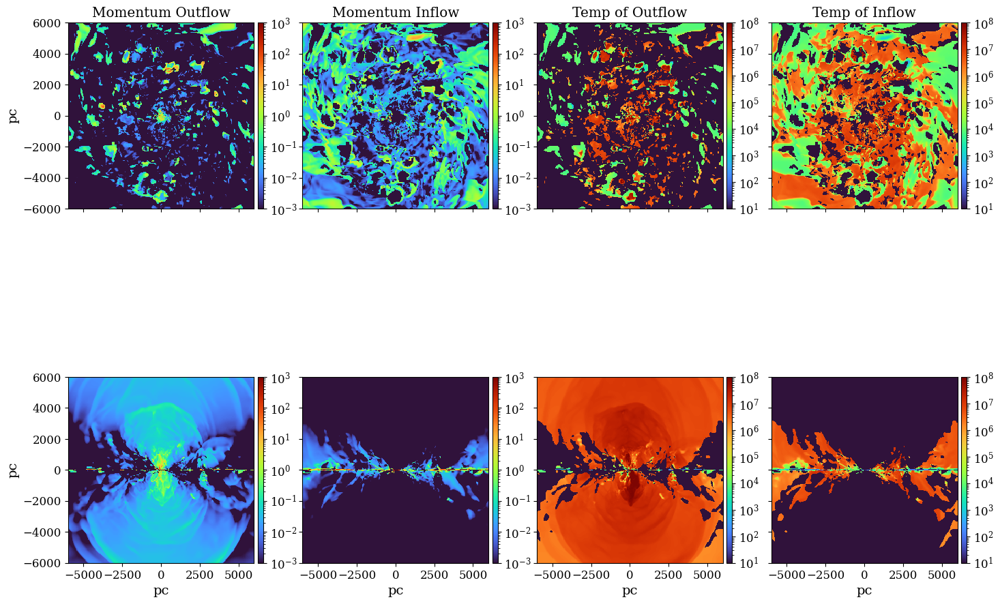

In [3]:
%reload_ext autoreload
#d  = get_last_dd( f'../cmz/cmz_test/outputs/cmz_fb4_nobondi_{fstring( 20 )}.bin', -1, enroll_prim=True, data_type = cmz_data );
#enroll_flux( d, 'mass', lambda bd : bd[ 'rho' ] * np.prod( bd[ 'dx' ], axis=0 ) )
#enroll_flux( d, 'met_fld' )
enroll_vel( d )
enroll_sgn( d, 'mom' )
enroll_sgn( d, "T_ent", "sgnvel" )
enroll_sgn( d, "met", "sgnvel" )

#R<500 z<140 definition of CMZ per 3-D CMZ battersby+2024

fig2 = f_plot_grid( d,  figsize=( 17, 13.5 ), 
                    xlims = [ ( -6000, 6000 ), ( -6000, 6000 ) ], 
                    ylims = [ ( -6000, 6000 ), ( -6000, 6000 ) ],
                    #log   = [ True, True, True, False ],
                    locs  = [ [ 140, 140, 140, 140 ],#, 140, 140 ], 
                              [ 1e-2, 1e-2, 1e-2, 1e-2 ] ],#, 1e-2, 1e-2 ] ],
                    #axes  = 2,
                    #z0s   = [ 1, 1, -1, 1 / ( 4 * np.pi * G_code ) ],
                    z0s   = [ 1, -1, 1, -1 ],#, 1, -1 ],
                    flds  = [ 'sgnmom[2]', 'sgnmom[2]', 'sgnT_ent[2]', 'sgnT_ent[2]' ],#, 'sgnflux_met_fld[2]', 'sgnflux_met_fld[2]' ],
                    names = [ 'Momentum Outflow', "Momentum Inflow", "Temp of Outflow", "Temp of Inflow" ],#,"Met Outflow", "Met Inflow" ],
                    zlims = [ ( 1e-3,1e3 ), ( 1e-3, 1e3 ), ( 1e1, 1e8 ), ( 1e1, 1e8 ) ],#, ( 1e-4,1e4 ), ( 1e-4, 1e4 ) ],
                    part_plot_i = [] )#( 1e-4, 1 ) ] )

<Axes: xlabel='$\\rho$ ($m_p$ cm$^{-3}$)', ylabel='$T$ (K)'>

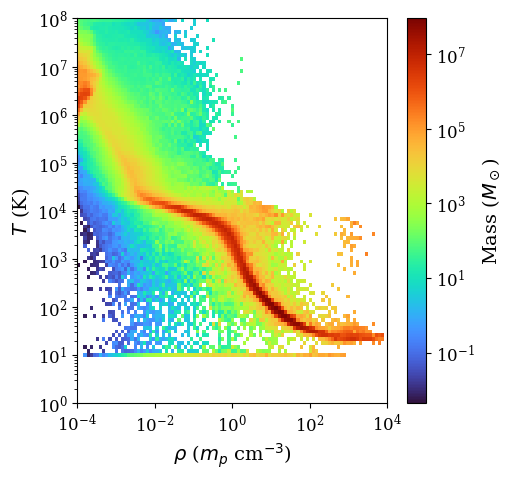

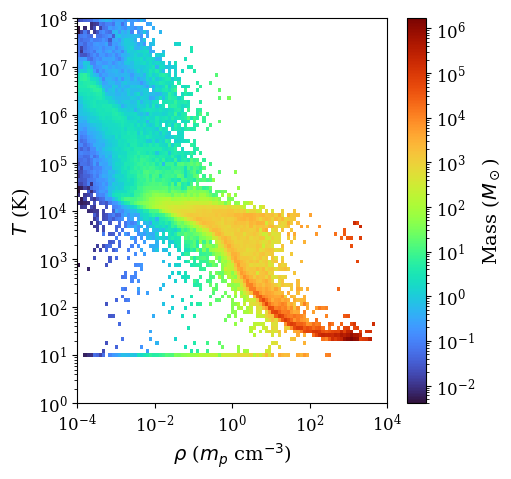

In [4]:
plt_phase( d )
plt_phase( d, R_out = 500, Z_out = 140 )

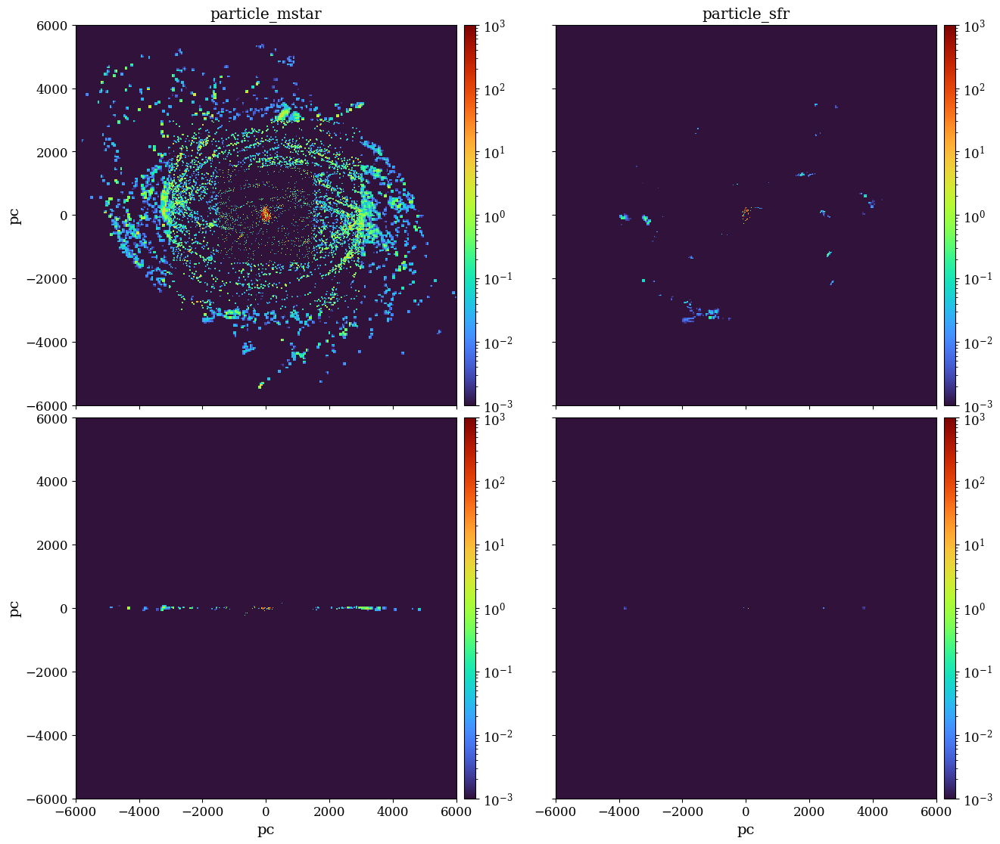

In [5]:
enroll_mesh_tree( d )
map_particle_blk( d, "particle_mstar", "particle_sfr" )
fig3 = f_plot_grid( d,  figsize=( 15, 13.5 ),
                    xlims = [ ( -6000, 6000 ), ( -6000, 6000 ) ], 
                    ylims = [ ( -6000, 6000 ), ( -6000, 6000 ) ],
                   flds = [ 'particle_mstar', "particle_sfr" ],
                   part_plot_i = [] )

/tmp/ipykernel_729376/1609533543.py:21: RuntimeWarning: overflow encountered in multiply
  ax.hist(( mstar[ in_cmz ] )*m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
/tmp/ipykernel_729376/1609533543.py:25: RuntimeWarning: overflow encountered in multiply
  ax.hist(( mstar[ in_cmz & recent ] )         *m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),


11456


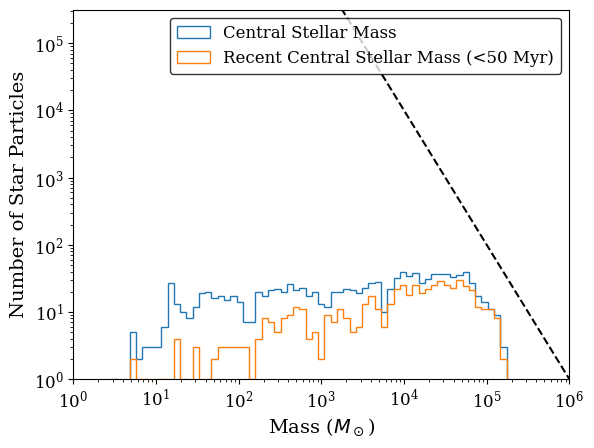

In [6]:
d_out = d
r = np.sqrt( np.sum( d_out.data['particle_x'].T**2, axis=0 ) )
R = np.sqrt( np.sum( d_out.data['particle_x'].T[ :2 ]**2, axis=0 ) )
z = d_out.data['particle_x'].T[ 2 ]
tcreate = d_out.data['particle_tcreate']
age     = d_out.data['particle_age']

in_cmz = ( R < 500 ) & ( np.abs( z ) < 140 )
recent = age < 50

mstar = d_out.data['particle_mstar']
m = d_out.data['particle_m']
sfr = d_out.data['particle_sfr']
SFdelay = d_out.data['particle_SFdelay']
RS0 = d_out.data['particle_RS0']
f,ax = plt.subplots()

xminlog = 0
xmaxlog = 6

ax.hist(( mstar[ in_cmz ] )*m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
         histtype='step',fill=False,stacked=False, label='Central Stellar Mass')
#ax.hist(( m    [ in_cmz ] )*m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
#         histtype='step',fill=False,stacked=False, label='Central Total Mass')
ax.hist(( mstar[ in_cmz & recent ] )         *m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
         histtype='step',fill=False,stacked=False, label='Recent Central Stellar Mass (<50 Myr)')
#ax.hist(( m )         *m0/modot,bins=10**np.linspace( xminlog, xmaxlog, 80 ),
#         histtype='step',fill=False,stacked=False, label='Recent Central Mass')
#ax.hist(( m - mstar )*m0/modot,bins=10**np.linspace(1,5,80),
#         histtype='step',fill=False,stacked=False, label='Gas Mass')
ax.set_xscale('log')
ax.set_yscale('log')
x = 10**np.linspace(2,10,100)
ax.plot(x, 10**12*x**-2, '--k')
ax.set_xlabel(r"Mass ($M_\odot$)")
plt.xlim([10**xminlog,10**xmaxlog])
ax.set_ylim([1e0,10**5.5])
ax.set_ylabel("Number of Star Particles")
ax.legend()
print( len( m ) )


Text(0, 0.5, 'Stellar Mass Formed ($M_\\odot$)')

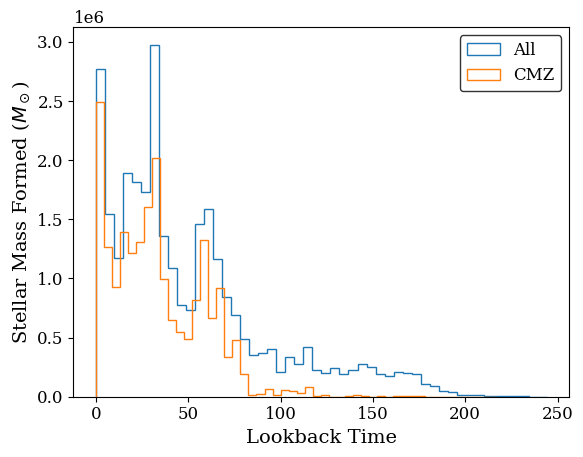

In [7]:
conv = m0 / modot
tcreate = d_out.data['particle_tcreate']
age     = d_out.data['particle_age']
plt.hist( age, weights=mstar*conv, bins=50, histtype='step', fill=False, label='All' )
plt.hist( age[ in_cmz ], weights=mstar[ in_cmz ]*conv, bins=50, histtype='step', fill=False, label='CMZ' )
plt.legend( )
plt.xlabel( "Lookback Time" )
plt.ylabel( "Stellar Mass Formed ($M_\odot$)" )

In [8]:
cmz_mstar = np.sum( ( mstar )[ in_cmz ] ) * m0 / modot / 1e8
cmz_sfr = np.sum(sfr[ in_cmz ]) * m0 / modot / ( t0 / yr )
cmz_sfrv2 = np.sum(sfr[ (SFdelay == 0) & in_cmz ]) * m0 / modot / ( t0 / yr )
print( cmz_mstar, cmz_sfr )

0.20035581752641934 1.0613291921489998


In [9]:
d_out.data.keys( )

dict_keys(['block_0', 'block_100', 'block_101', 'block_102', 'block_103', 'block_104', 'block_105', 'block_106', 'block_107', 'block_108', 'block_109', 'block_10', 'block_110', 'block_111', 'block_112', 'block_113', 'block_114', 'block_115', 'block_116', 'block_117', 'block_118', 'block_119', 'block_11', 'block_120', 'block_121', 'block_122', 'block_123', 'block_124', 'block_125', 'block_126', 'block_127', 'block_128', 'block_129', 'block_12', 'block_130', 'block_131', 'block_132', 'block_133', 'block_134', 'block_135', 'block_136', 'block_137', 'block_138', 'block_139', 'block_13', 'block_140', 'block_141', 'block_142', 'block_143', 'block_144', 'block_145', 'block_146', 'block_147', 'block_148', 'block_149', 'block_14', 'block_150', 'block_151', 'block_152', 'block_153', 'block_154', 'block_155', 'block_156', 'block_157', 'block_158', 'block_159', 'block_15', 'block_160', 'block_161', 'block_162', 'block_163', 'block_164', 'block_165', 'block_166', 'block_167', 'block_168', 'block_16

In [10]:
dyt = load_kratos_yt( d_out, fld_extra = [ "particle_mstar", "particle_sfr" ] )

yt : [WARNING  ] 2026-05-21 20:39:33,715 Overriding code units: Use this option only if you know that the dataset doesn't define the units correctly or at all.
yt : [INFO     ] 2026-05-21 20:39:33,716 Overriding length_unit: 3.0857e+18 cm.
yt : [INFO     ] 2026-05-21 20:39:33,716 Overriding time_unit: 31536000000000.0 s.
yt : [INFO     ] 2026-05-21 20:39:33,717 Overriding mass_unit: 4.914262907092623e+31 g.
yt : [WARNING  ] 2026-05-21 20:39:33,717 Assuming 1.0 = 1.0 K
yt : [INFO     ] 2026-05-21 20:39:33,980 Parameters: current_time              = 260.0000132489494
yt : [INFO     ] 2026-05-21 20:39:33,981 Parameters: domain_dimensions         = [128 128 128]
yt : [INFO     ] 2026-05-21 20:39:33,981 Parameters: domain_left_edge          = [-12000. -12000. -12000.]
yt : [INFO     ] 2026-05-21 20:39:33,982 Parameters: domain_right_edge         = [12000. 12000. 12000.]
yt : [INFO     ] 2026-05-21 20:39:33,982 Parameters: cosmological_simulation   = 0


yt : [INFO     ] 2026-05-21 20:39:35,047 xlim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:39:35,047 ylim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:39:35,049 xlim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:39:35,050 ylim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:39:35,051 Making a fixed resolution buffer of (('gas', 'temperature')) 800 by 800



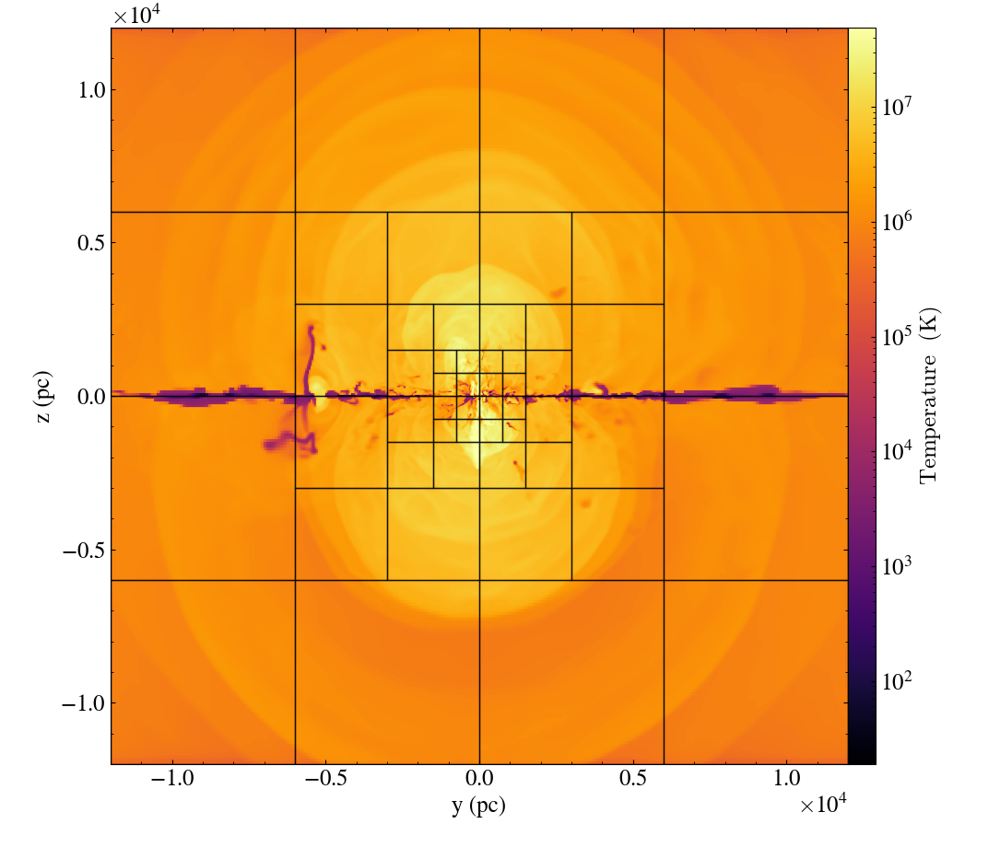

In [11]:
import yt


slc = yt.SlicePlot(dyt, "x", ("gas", "temperature"))
slc.set_cmap(("gas", "temperature"), "inferno")
slc.set_unit(("gas", "temperature"), "K")
slc.set_axes_unit( 'pc' )
slc.set_xlabel('y (pc)')
slc.set_ylabel('z (pc)')
slc.annotate_grids(cmap=None)

#slc.save("yt_temp.png")
slc.show()

yt : [INFO     ] 2026-05-21 20:39:54,683 Projection completed
yt : [INFO     ] 2026-05-21 20:39:54,684 xlim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:39:54,684 ylim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:39:54,686 xlim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:39:54,687 ylim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:39:54,687 Making a fixed resolution buffer of (('gas', 'temperature')) 800 by 800



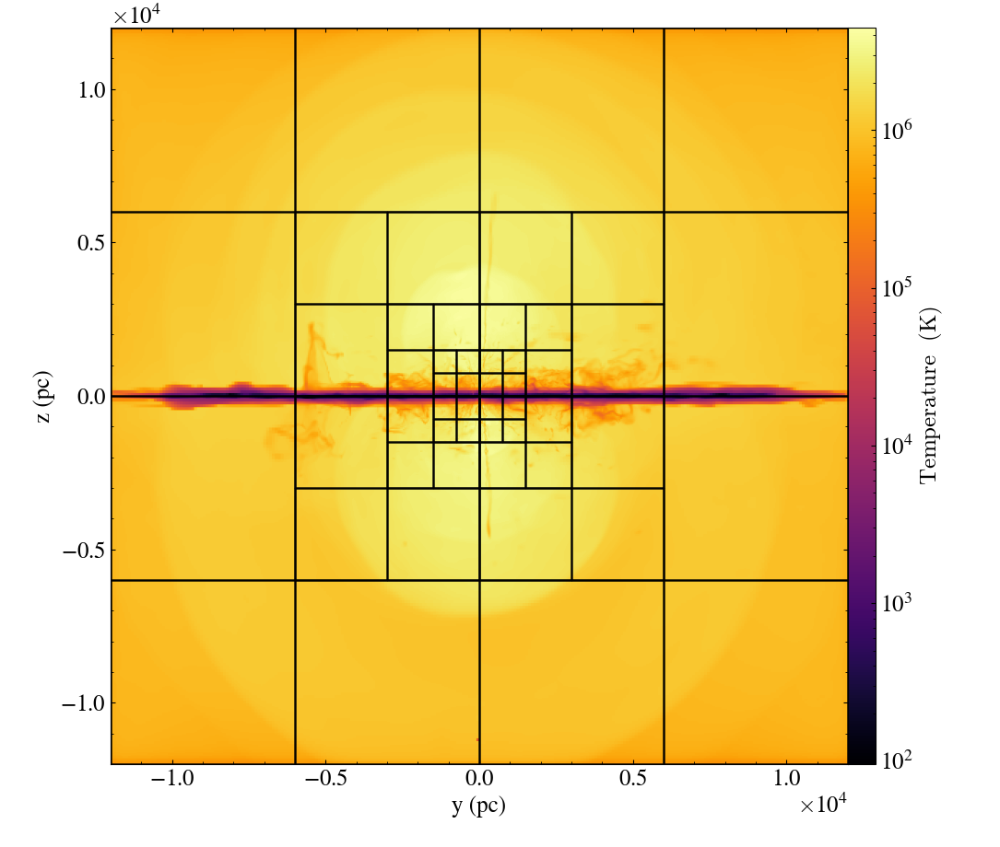

In [12]:
slc = yt.ProjectionPlot(dyt, "x", ("gas", "temperature"),weight_field=("gas","density"))
slc.set_cmap(("gas", "temperature"), "inferno")
slc.set_unit(("gas", "temperature"), "K")
slc.set_axes_unit( 'pc' )
slc.set_xlabel('y (pc)')
slc.set_ylabel('z (pc)')
slc.annotate_grids(cmap=None)

#slc.save("yt_temp.png")
slc.show()

yt : [INFO     ] 2026-05-21 20:39:55,359 xlim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:39:55,359 ylim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:39:55,361 xlim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:39:55,362 ylim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:39:55,363 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800
yt : [INFO     ] 2026-05-21 20:39:56,490 Saving plot slice_dens_streamlines.png



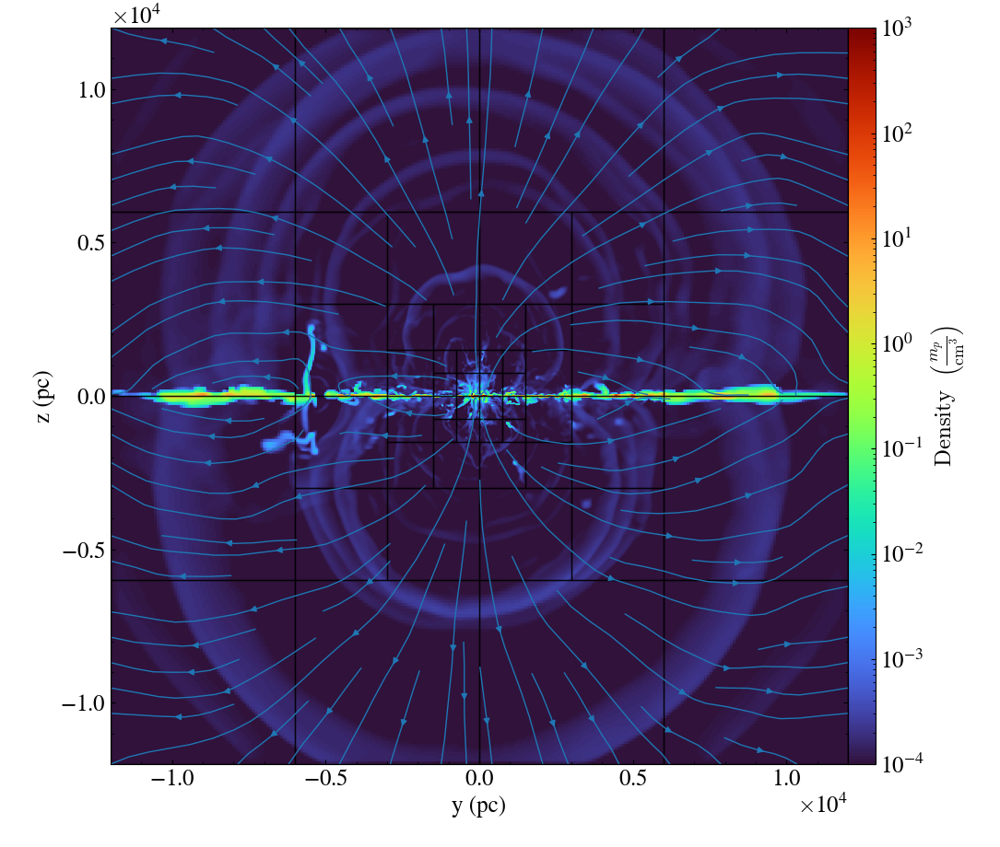

In [13]:
slc = yt.SlicePlot(dyt, "x", ("gas", "density"))
slc.set_cmap(("gas", "density"), "turbo")
slc.set_unit(("gas", "density"), "mp/cm**3")
slc.set_axes_unit( 'pc' )
slc.set_xlabel('y (pc)')
slc.set_ylabel('z (pc)')
slc.annotate_grids(cmap=None)
slc.annotate_streamlines(("gas", "velocity_y"), ("gas", "velocity_z"))
slc.save("slice_dens_streamlines.png")
slc.show()

yt : [INFO     ] 2026-05-21 20:39:57,184 xlim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:39:57,185 ylim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:39:57,187 xlim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:39:57,187 ylim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:39:57,188 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800



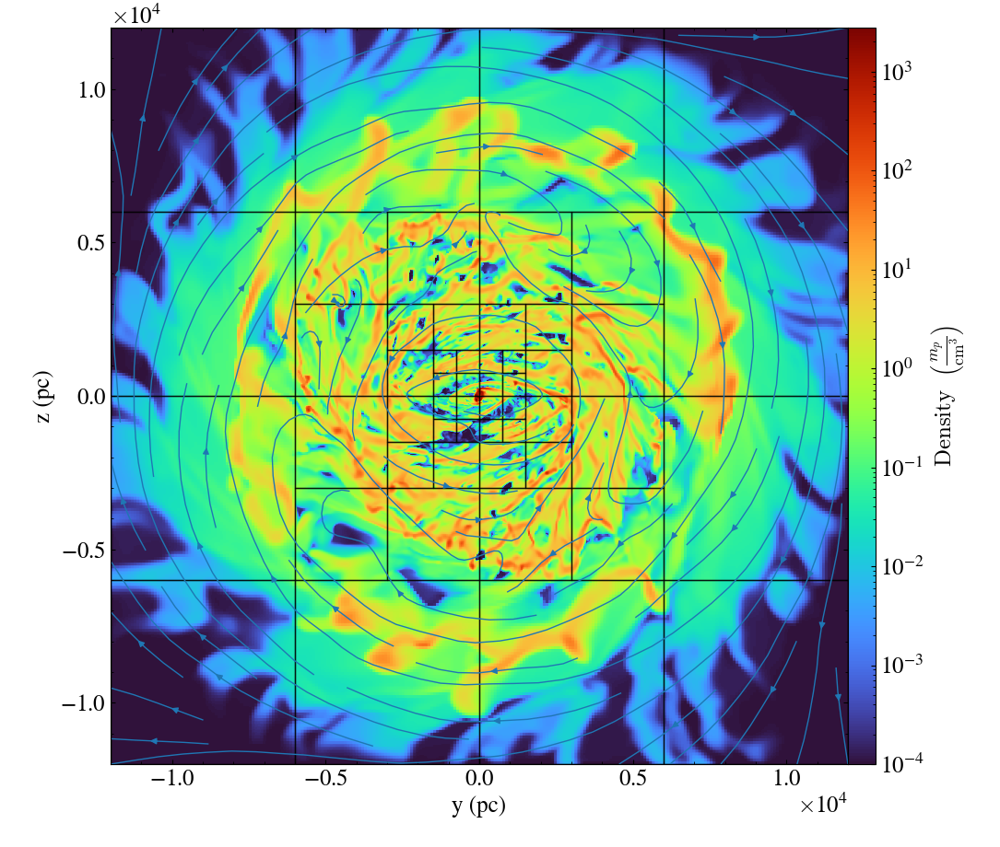

In [14]:
slc = yt.SlicePlot(dyt, "z", ("gas", "density"))
slc.set_cmap(("gas", "density"), "turbo")
slc.set_unit(("gas", "density"), "mp/cm**3")
slc.set_axes_unit( 'pc' )
slc.set_xlabel('y (pc)')
slc.set_ylabel('z (pc)')
slc.annotate_grids(cmap=None)
slc.annotate_streamlines(("gas", "velocity_x"), ("gas", "velocity_y"))
#slc.save("slice_dens_faceon.png")
slc.show()

yt : [INFO     ] 2026-05-21 20:40:04,660 Projection completed
yt : [INFO     ] 2026-05-21 20:40:04,661 xlim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:40:04,661 ylim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:40:04,663 xlim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:40:04,664 ylim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:40:04,665 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800
yt : [INFO     ] 2026-05-21 20:40:05,049 Saving plot yt_dens_faceon.png



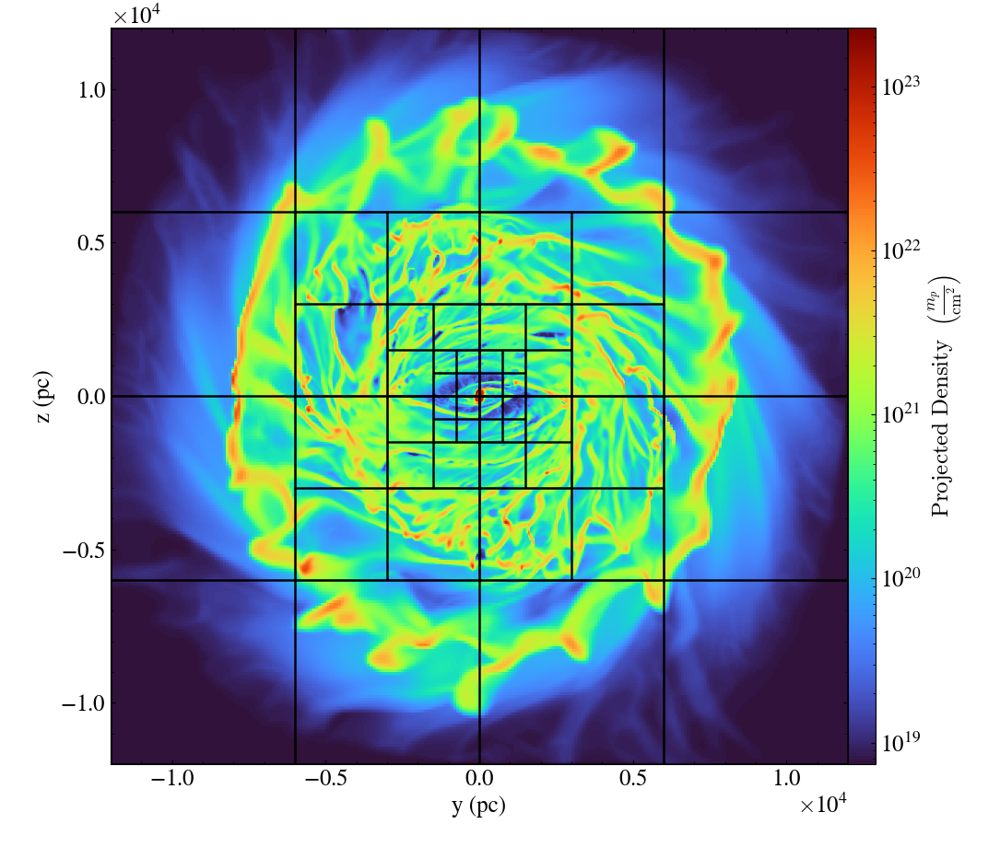

In [15]:
slc = yt.ProjectionPlot(dyt, "z", ("gas", "density"))
slc.set_cmap(("gas", "density"), "turbo")
slc.set_unit(("gas", "density"), "mp/cm**2")
slc.set_axes_unit( 'pc' )
slc.set_xlabel('y (pc)')
slc.set_ylabel('z (pc)')
slc.annotate_grids(cmap=None)
slc.save("yt_dens_faceon.png")
slc.show()

yt : [INFO     ] 2026-05-21 20:40:10,823 Projection completed
yt : [INFO     ] 2026-05-21 20:40:10,824 xlim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:40:10,824 ylim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:40:10,826 xlim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:40:10,827 ylim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:40:10,827 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800



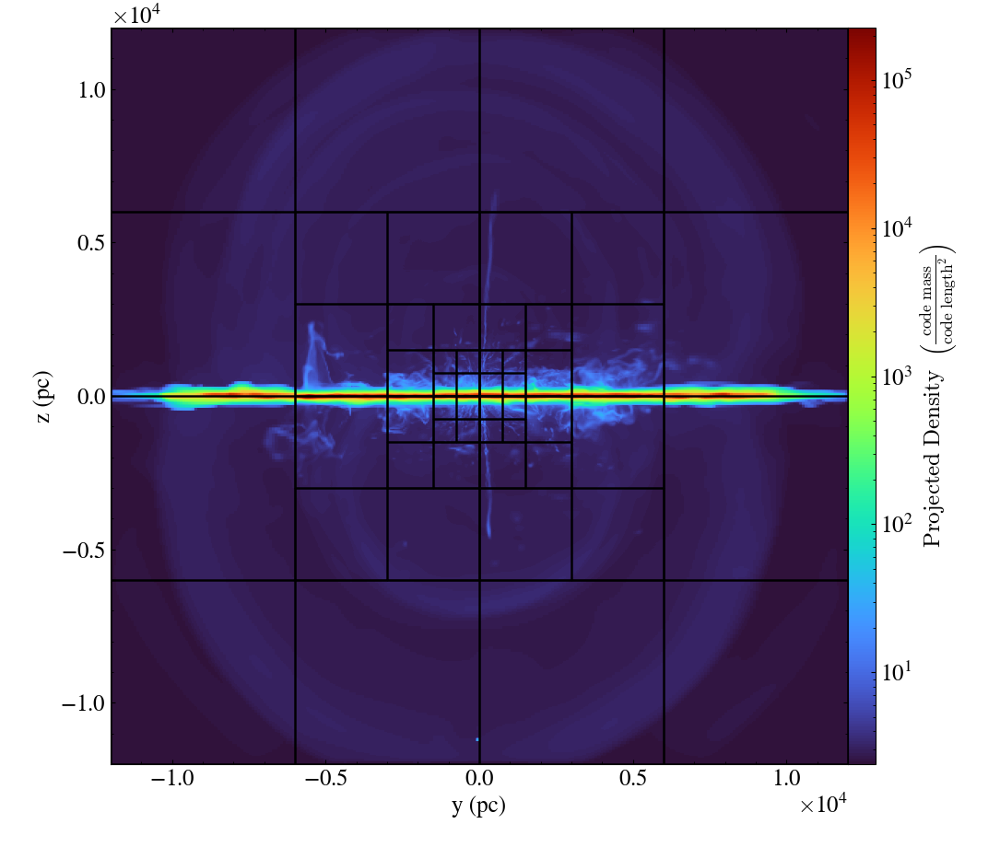

In [16]:
slc = yt.ProjectionPlot(dyt, "x", ("gas", "density"))
slc.set_cmap(("gas", "density"), "turbo")
#slc.set_unit(("gas", "density"), "mp/cm**3")
slc.set_axes_unit( 'pc' )
slc.set_xlabel('y (pc)')
slc.set_ylabel('z (pc)')
slc.annotate_grids(cmap=None)
#slc.save("yt_dens.png")
slc.show()

pyxsim : [WARNING  ] 2026-05-21 20:40:11,501 For the 'cloudy' model, the only available abundance table is 'feld', so using that one.
pyxsim : [INFO     ] 2026-05-21 20:40:11,671 kT_min = 0.2 keV
pyxsim : [INFO     ] 2026-05-21 20:40:11,671 kT_max = 64 keV
pyxsim : [WARNING  ] 2026-05-21 20:40:11,672 Not all fields have the same field type! Fields used: [('gas', 'density'), ('gas', 'temperature'), ('athena_pp', 'metallicity')]
pyxsim : [INFO     ] 2026-05-21 20:40:11,673 Using emission measure field '('gas', 'density')'.
pyxsim : [INFO     ] 2026-05-21 20:40:11,673 Using temperature field '('gas', 'temperature')'.
yt : [INFO     ] 2026-05-21 20:40:56,936 Projection completed
yt : [INFO     ] 2026-05-21 20:40:56,939 xlim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:40:56,939 ylim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:40:56,942 xlim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:40:56,943 ylim = -12000.000000 12000.000000
yt : [INFO     ]


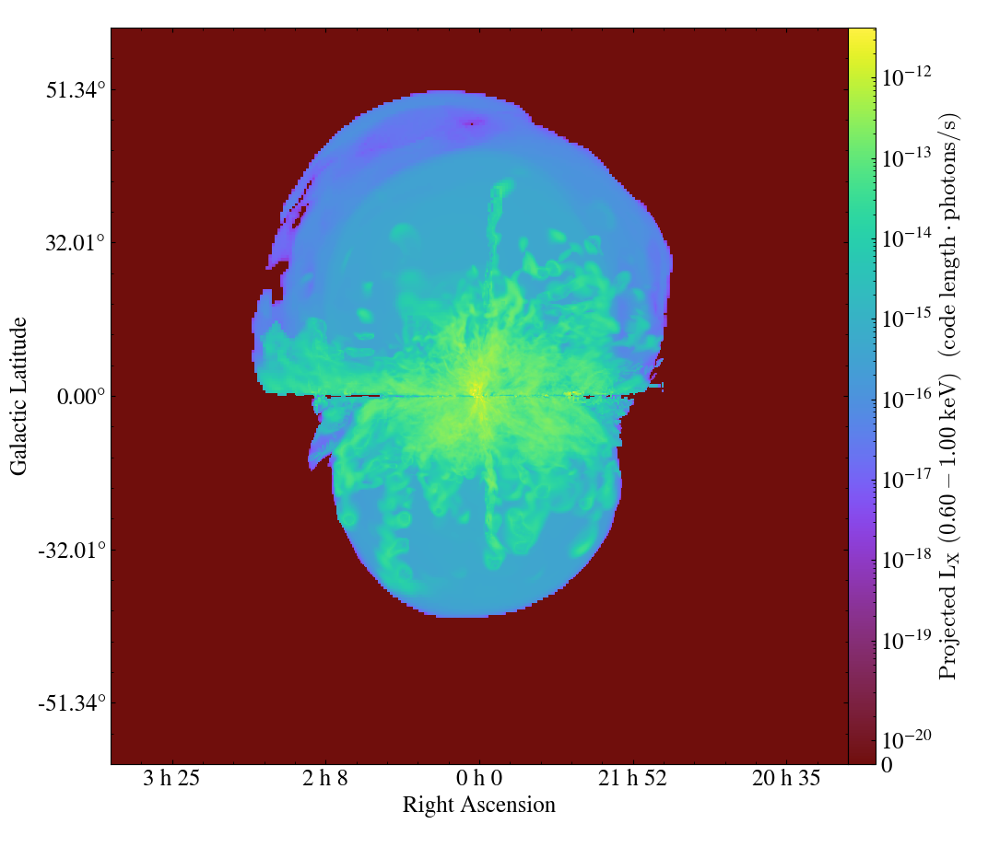

In [17]:
from matplotlib.ticker import FuncFormatter
import pyxsim
from math import floor
D = 8000
def y_to_angle( y, pos ):
    theta = np.arctan(y / D)
    return f"{np.degrees(theta):.2f}°"
def x_to_RA( x, pos ):
    theta = np.arctan(-x / D)
    if theta < 0:
        theta += 2*np.pi#- theta
    RA = theta * 12 / np.pi
    hour = int( floor( RA ) )
    min = round( ( RA - hour ) * 60 )
    return f"{hour} h {min}"
thermal_model  = pyxsim.CIESourceModel( "cloudy", 0.2, 11, 10000, ( "athena_pp", "metallicity" ), kT_min=0.2, emission_measure_field=( "gas", "density" )  )
#thermal_model  = pyxsim.CIESourceModel( "cloudy", 0.2, 11, 10000, 1, kT_min=0.2, emission_measure_field=( "gas", "density" )  )
#thermal_model2 = pyxsim.IGMSourceModel( "cloudy", 0.05, 11, 10000, ( "athena_pp", "metallicity" ), kT_min=0.1, emission_measure_field=( "gas", "density" )  )
xray = thermal_model.make_source_fields( dyt, 0.6, 1 )
prj = yt.ProjectionPlot(
    dyt, "x", ("gas", 'xray_photon_count_rate_0.6_1_keV') )#, weight_field=( "gas", "mass" ) )
#)
#prj.set_unit( ("gas", 'xray_emissivity_0.6_1_keV'), "erg/s/cm**2" )
prj.set_axes_unit( 'pc' )
prj.set_ylabel('Galactic Latitude')
prj.set_xlabel('Right Ascension')

prj._setup_plots()
ax = prj.plots[("gas", 'xray_photon_count_rate_0.6_1_keV')].axes
ax.yaxis.set_major_formatter(FuncFormatter(y_to_angle))
ax.xaxis.set_major_formatter(FuncFormatter(x_to_RA))
prj.show()

In [18]:
xray

[('gas', 'xray_emissivity_0.6_1_keV'),
 ('gas', 'xray_luminosity_0.6_1_keV'),
 ('gas', 'xray_photon_emissivity_0.6_1_keV'),
 ('gas', 'xray_photon_count_rate_0.6_1_keV')]

yt : [INFO     ] 2026-05-21 20:41:49,496 Projection completed
yt : [INFO     ] 2026-05-21 20:41:49,499 xlim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:41:49,499 ylim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:41:49,502 xlim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:41:49,503 ylim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 20:41:49,503 Making a fixed resolution buffer of (('gas', 'xray_emissivity_0.6_1_keV')) 800 by 800


Simulation extent: x=[-12000, 12000] pc, y=[-12000, 12000] pc
Max angle: RA=56.3°, Dec=56.3°
RA range:  [0.1°, 359.9°]
Dec range: [-56.3°, 56.3°]


/home/cmz_colab/.local/lib/python3.10/site-packages/skyproj/_skyproj.py:636: FutureWarning: skyproj.pcolormesh() has been deprecated and will be removed in v2.5. Please access via skyproj.ax.pcolormesh()
  warnings.warn(


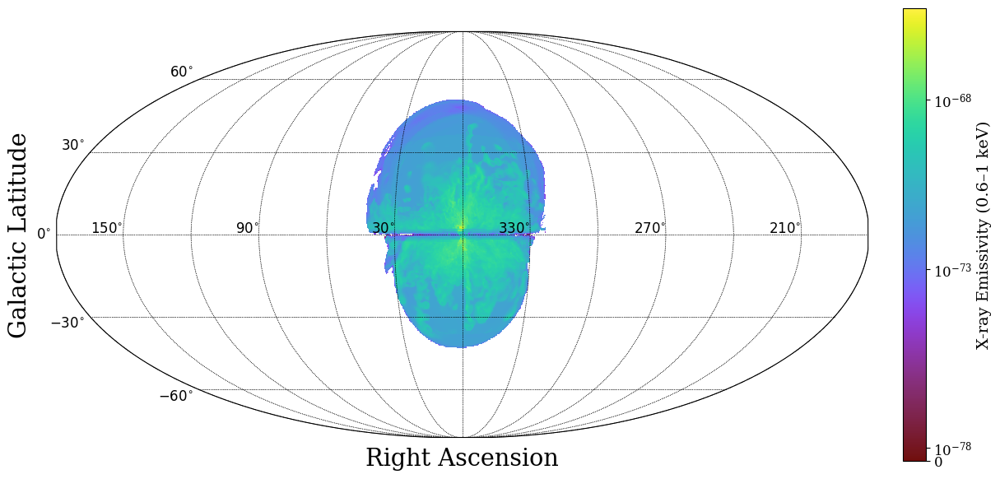

In [19]:
import skyproj

D = 8000  # pc — observer distance

# --- 1. Extract yt image ---
prj = yt.ProjectionPlot(
    dyt, "x", ("gas", "xray_emissivity_0.6_1_keV"), weight_field=("gas", "mass")
)
prj.set_axes_unit("pc")
prj._setup_plots()

yt_plot = prj.plots[("gas", "xray_emissivity_0.6_1_keV")]
yt_ax   = yt_plot.axes
img     = yt_ax.get_images()[0]
data    = img.get_array().copy()
extent  = img.get_extent()          # [xmin_pc, xmax_pc, ymin_pc, ymax_pc]
xmin_pc, xmax_pc, ymin_pc, ymax_pc = extent

print(f"Simulation extent: x=[{xmin_pc:.0f}, {xmax_pc:.0f}] pc, "
      f"y=[{ymin_pc:.0f}, {ymax_pc:.0f}] pc")
print(f"Max angle: RA={np.degrees(np.arctan(abs(xmax_pc)/D)):.1f}°, "
      f"Dec={np.degrees(np.arctan(abs(ymax_pc)/D)):.1f}°")

# --- 2. Build pixel-center coordinate grids ---
ny, nx = data.shape
# pixel centers (not edges)
xs_pc = np.linspace(xmin_pc, xmax_pc, nx)
ys_pc = np.linspace(ymin_pc, ymax_pc, ny)
XX, YY = np.meshgrid(xs_pc, ys_pc)

# Angular distance from observer at (D, 0, 0) looking toward Galactic center
# RA: arctan of transverse x offset (note sign convention: RA increases left)
RA_deg  = np.degrees(np.arctan2(-XX, D)) % 360   # 0–360°
Dec_deg = np.degrees(np.arctan2( YY, np.sqrt(XX**2 + D**2)))  # true elevation

# --- 3. Sanity-check the angular range ---
print(f"RA range:  [{RA_deg.min():.1f}°, {RA_deg.max():.1f}°]")
print(f"Dec range: [{Dec_deg.min():.1f}°, {Dec_deg.max():.1f}°]")

# --- 4. Mask zeros/negatives ---
masked_data = np.ma.masked_where(data <= 0, data)

cmap = img.cmap
cmap.set_bad(color='none')
norm = img.norm

# --- 5. pcolormesh needs CORNER coordinates, not centers ---
# Compute edge grids (shape ny+1, nx+1) for pcolormesh
xs_edge = np.linspace(xmin_pc, xmax_pc, nx + 1)
ys_edge = np.linspace(ymin_pc, ymax_pc, ny + 1)
XXe, YYe = np.meshgrid(xs_edge, ys_edge)
RA_edge  = np.degrees(np.arctan2(-XXe, D)) % 360
Dec_edge = np.degrees(np.arctan2( YYe, np.sqrt(XXe**2 + D**2)))

# --- 6. Plot ---
fig, raw_ax = plt.subplots(figsize=(12, 6))
sp = skyproj.MollweideSkyproj(
    ax=raw_ax,
    lon_0=0,          # center on RA=0 (Galactic center)
    celestial=True,
    gridlines=True,
)

# pcolormesh with explicit 2D corner arrays — no smearing
pcm = sp.pcolormesh(
    RA_edge, Dec_edge, masked_data,
    norm=norm,
    cmap=cmap,
    rasterized=True,
)

sp.ax.set_xlabel("Right Ascension")
sp.ax.set_ylabel("Galactic Latitude")
fig.colorbar(pcm, ax=sp.ax, label="X-ray Emissivity (0.6–1 keV)",
             fraction=0.03, pad=0.04)
plt.tight_layout()
plt.show()

In [20]:
from yt.data_objects.level_sets.api import *

ds = dyt.disk( [ 0,0,0 ], [ 0, 0, 1 ], ( 12, "kpc" ), ( 500, "pc" ) )
master_clump = Clump( ds, ( "gas", "density" ) )

In [21]:
c_min = ds["gas", "density"].min()
c_max = ds["gas", "density"].max()
step = 10.0
find_clumps(master_clump, c_min, c_max, step)

yt : [INFO     ] 2026-05-21 20:41:53,932 Finding clumps: min: 9.997645e-05, max: 7.886511e+03, step: 10.000000
yt : [INFO     ] 2026-05-21 20:41:56,796 Linking node (104) contours.
yt : [INFO     ] 2026-05-21 20:42:07,721 Linked.
Updating joins ... : 100%|██████████| 104/104 [00:00<00:00, 379.47it/s]
yt : [INFO     ] 2026-05-21 20:42:09,268 Finding clumps: min: 9.997645e-04, max: 7.886511e+03, step: 10.000000
yt : [INFO     ] 2026-05-21 20:42:09,270 Wiping out existing children clumps: 1.
yt : [INFO     ] 2026-05-21 20:42:09,916 Linking node (104) contours.
yt : [INFO     ] 2026-05-21 20:42:20,896 Linked.
Updating joins ... : 100%|██████████| 104/104 [00:00<00:00, 393.56it/s]
yt : [INFO     ] 2026-05-21 20:42:28,485 Investigating 289 children.
yt : [INFO     ] 2026-05-21 20:42:28,487 Finding clumps: min: 9.997645e-03, max: 7.886511e+03, step: 10.000000
yt : [INFO     ] 2026-05-21 20:42:31,527 Linking node (104) contours.
yt : [INFO     ] 2026-05-21 20:42:42,473 Linked.
Updating joins .

In [28]:
master_clump[ "gas", "density"]

unyt_array([1.71981178e-04, 1.72967342e-04, 1.73159096e-04, ...,
       1.17250444e-02, 2.27397612e-01, 5.06051466e-01], 'code_mass/code_length**3')

yt : [INFO     ] 2026-05-21 23:02:26,191 Projection completed
yt : [INFO     ] 2026-05-21 23:02:26,194 xlim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 23:02:26,194 ylim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 23:02:26,197 xlim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 23:02:26,198 ylim = -12000.000000 12000.000000
yt : [INFO     ] 2026-05-21 23:02:26,199 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800
yt : [INFO     ] 2026-05-21 23:02:26,602 Pixelizing contour 0
yt : [INFO     ] 2026-05-21 23:02:28,152 Pixelizing contour 1
yt : [INFO     ] 2026-05-21 23:02:28,177 Pixelizing contour 2
yt : [INFO     ] 2026-05-21 23:02:28,199 Pixelizing contour 3
yt : [INFO     ] 2026-05-21 23:02:28,221 Pixelizing contour 4
yt : [INFO     ] 2026-05-21 23:02:28,243 Pixelizing contour 5
yt : [INFO     ] 2026-05-21 23:02:28,266 Pixelizing contour 6
yt : [INFO     ] 2026-05-21 23:02:28,289 Pixelizing contour 7
yt : [INFO     ] 2026-05-21 23:02


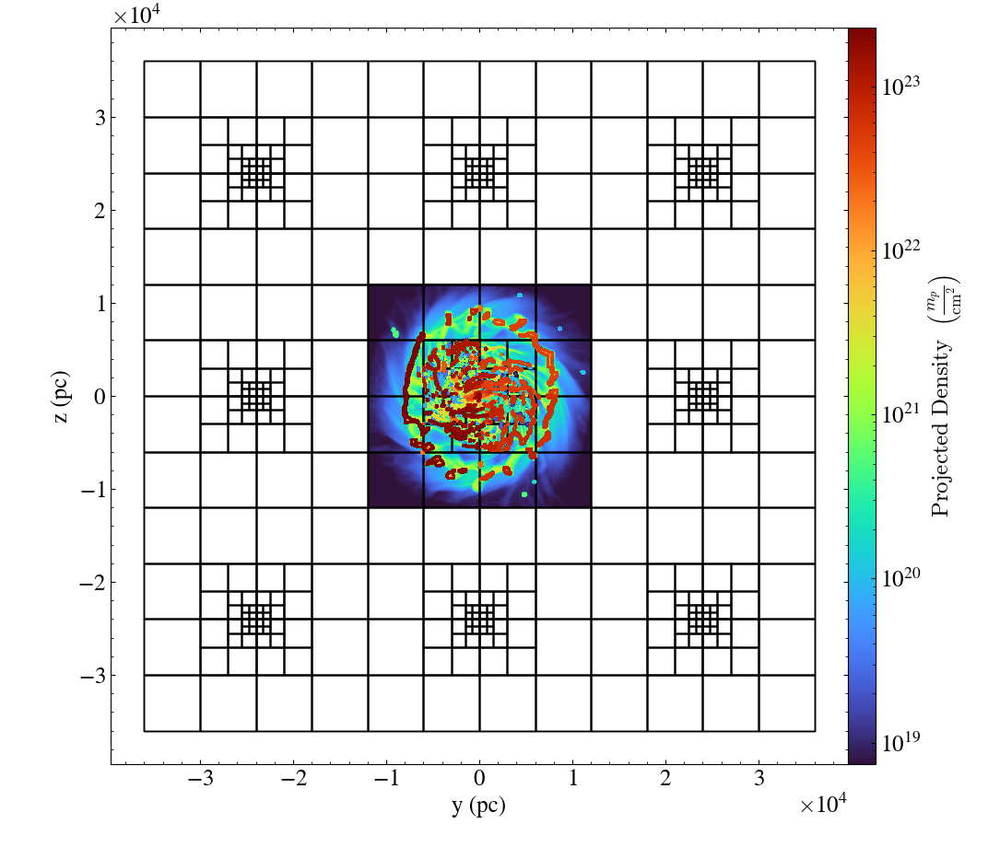

In [29]:
slc = yt.ProjectionPlot(dyt, "z", ("gas", "density"))
slc.set_cmap(("gas", "density"), "turbo")
slc.set_unit(("gas", "density"), "mp/cm**2")
slc.set_axes_unit( 'pc' )
slc.set_xlabel('y (pc)')
slc.set_ylabel('z (pc)')
slc.annotate_grids(cmap=None)
slc.annotate_clumps( master_clump.leaves )
slc.show()

In [37]:
clumpmasses = []
for clump in master_clump:
    clumpmasses.append( np.sum( clump["gas","mass"] ) )
clumpmasses = np.array( clumpmasses )

In [ ]:
for clump in master_clump:
    print( clump[ "gas"])

(1.0, 100.0)

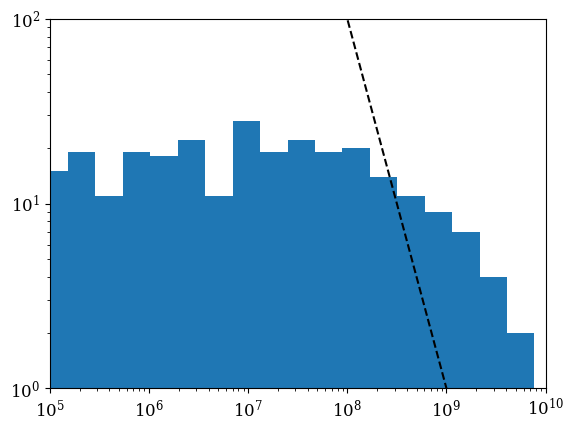

In [50]:
logcm = np.log10( clumpmasses )
bins = 10**np.linspace( logcm.min(), logcm.max(), 40 )
plt.hist( clumpmasses, bins=bins )
plt.plot( bins, 10**18*bins**-2, '--k' )
plt.xscale('log')
plt.yscale('log')
plt.xlim( [ 1e5, 1e10 ] )
plt.ylim( [ 1e0, 1e2 ] )

In [51]:
fn = master_clump.save_as_dataset(fields=["density", "mass"])

yt : [INFO     ] 2026-05-21 23:27:31,341 Saving field data to yt dataset: tmplgm2tep7_clump_0.h5.
